In [1]:
import numpy as np
import netCDF4 as nc
import pyfesom2 as pf
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker 
import matplotlib as mpl
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point

import cmocean

from  scipy  import   stats

In [2]:
%%bash 
datapath=/work/ba0989/a270075/awiesm2.5/experiments-2/tran20-32k-sed10/outdata/fesom/
cdo cat  ${datapath}/MLD1.fesom.????01.01.nc  tmp.nc 
cdo -yearmean  tmp.nc   MLD1.fesom.nc 
rm tmp.nc 
mkdir -p  MLD1

cdo    cat: Processed 690292272 values from 604 variables over 7248 timesteps [44.87s 56MB].
cdo    yearmean: Processed 690292272 values from 1 variable over 7851 timesteps [2.79s 64MB].


In [3]:
meshpath = '/home/a/a270075/ba0989/pool/meshes/base21k/mesh_ice38pma1_ocean21_shallowMed/'
datapath = '/work/ba0989/a270075/awiesm2.5/experiments-2/tran20-32k-sed10/outdata/fesom/'

mesh = pf.load_mesh(meshpath)
elem2=mesh.elem[mesh.no_cyclic_elem,:]

### read data #############
# import warnings
# with warnings.catch_warnings():
#     warnings.simplefilter("ignore")
ds = xr.open_dataset('MLD1.fesom.nc')
data = ds['MLD1'].values    
print(data.shape, mesh.x2.shape, elem2.shape)
nyear = data.shape[0]

datamean = np.mean(data[0:5,:],axis=0)

/home/a/a270075/ba0989/pool/meshes/base21k/mesh_ice38pma1_ocean21_shallowMed/pickle_mesh_py3_fesom2
The usepickle == True)
The pickle file for FESOM2 exists.
The mesh will be loaded from /home/a/a270075/ba0989/pool/meshes/base21k/mesh_ice38pma1_ocean21_shallowMed/pickle_mesh_py3_fesom2
(604, 95239) (95239,) (185268, 3)


/home/a/a270075/.local/lib/python3.10/site-packages/xarray/coding/times.py:832: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/home/a/a270075/.local/lib/python3.10/site-packages/xarray/core/indexing.py:560: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()


{'ellps': 'WGS84', 'proj': 'stere', 'lat_0': 90, 'lon_0': -45, 'x_0': 0.0, 'y_0': 0.0, 'lat_ts': 70.0}
{'ellps': 'WGS84', 'proj': 'stere', 'lat_0': -90, 'lon_0': -45, 'x_0': 0.0, 'y_0': 0.0, 'lat_ts': -70.0}
0


/tmp/ipykernel_2481316/621013683.py:58: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/tmp/ipykernel_2481316/621013683.py:66: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


5
10
15
20
25
30
35
40
45
50
55
60
65
70
75
80
85
90
95
100
105
110
115
120
125
130
135
140
145
150
155
160
165
170
175
180
185
190
195
200
205
210
215
220
225
230
235
240
245
250
255
260
265
270
275
280
285
290
295
300
305
310
315
320
325
330
335
340
345
350
355
360
365
370
375
380
385
390
395
400
405
410
415
420
425
430
435
440
445
450
455
460
465
470
475
480
485
490
495
500
505
510
515
520
525
530
535
540
545
550
555
560
565
570
575
580
585
590
595
600


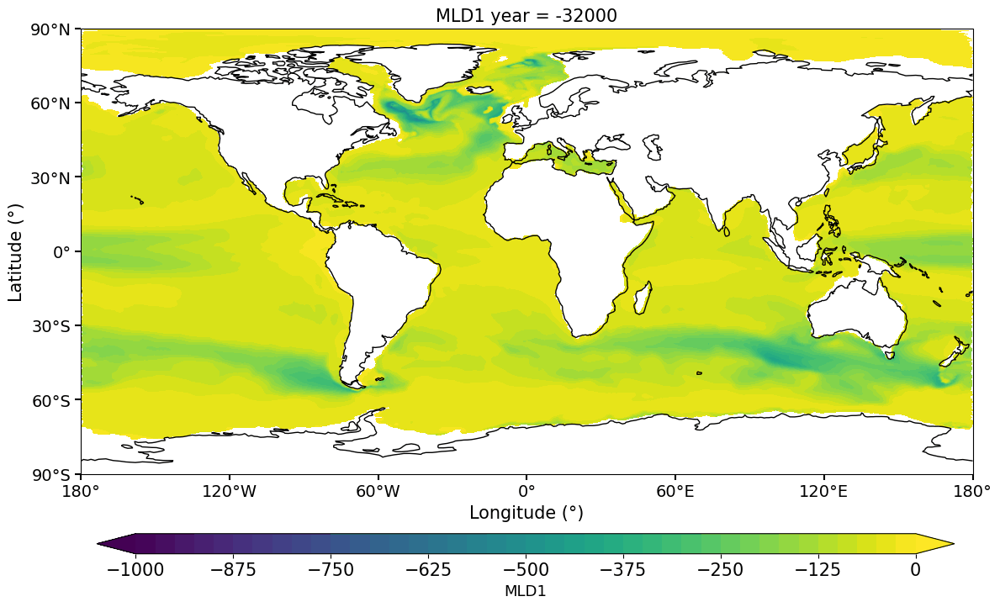

In [9]:
#____ plotting _________
minval = -1000
maxval = 0
nbreaks = 41
breaks = np.linspace(minval ,maxval ,nbreaks)
color = plt.cm.viridis  #cmocean.cm.phase  #haline

################
proj = ccrs.PlateCarree()
crs_target = ccrs.NorthPolarStereo(central_longitude= -45,true_scale_latitude=70.,globe=None)
crs_target2 = ccrs.SouthPolarStereo(central_longitude= -45,true_scale_latitude=-70.,globe=None)
print(crs_target.proj4_params)
print(crs_target2.proj4_params)

lonticks = np.arange(-180.,180.1,60.)
latticks = np.arange(-90.,90.1,30.)
lon_formatter = cticker.LongitudeFormatter()   
lat_formatter = cticker.LatitudeFormatter()

                
# ############### normal projection  ###############

## for gif files
import imageio
frames = []


for i in range(0, nyear, 5):
    print(i)
    
    fig = plt.figure(figsize=(12,8))
    
    ax = fig.add_subplot(1, 1, 1,projection=proj)
    cs = ax.tricontourf(mesh.x2, mesh.y2, elem2, np.mean(data[i:i+5,:],axis=0) , extend='both', cmap=color,levels=breaks) 
    ax.set_extent([-180,180, -90,90], crs=proj)

    iceyear = i*20 - 32000
    ax.set_title('MLD1 year = '+str(iceyear), fontsize=15)
    ax.set_xlabel("Longitude (°)", fontsize=15)
    ax.set_ylabel("Latitude (°)", fontsize=15)

    ax.set_global()
    ax.coastlines()    
    ax.set_yticks(latticks, crs=proj)
    ax.set_xticks(lonticks, crs=proj)
    ax.tick_params(axis='x', which='major', direction='out',size=5, width=1.5, labelsize=14)
    ax.tick_params(axis='y', which='major', direction='out',size=5, width=1.5, labelsize=14)
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)


    cax = plt.axes([0.1,0.05,0.85,0.03])
    cbar = plt.colorbar(cs,cax=cax, orientation='horizontal', fraction=0.02, extend='both')
    cbar.set_label(label='MLD1', size=13, ) #weight='bold')
    cbar.ax.tick_params(labelsize=15)  #labelsize=15
    # cbar.set_ticks(np.arange(minval,maxval+0.1,0.25))

    fig.tight_layout()

    filename = f'MLD1/plots_{i+1:03d}.png'
    # fig.text(0.45,0.95, 'year='+str(i), fontsize=20)
    plt.savefig(filename,bbox_inches='tight',)
    plt.close()  # Close the figure to save memory

    
    image = imageio.imread(filename)
    frames.append(image)
    


gifname = "animated_MLD1.gif"
# Save to GIF
imageio.mimsave(gifname, frames, duration=0.3)  # duration in seconds per frame

from IPython.display import Image

# Display the GIF inline
Image(filename=gifname) 